<a href="https://colab.research.google.com/github/leogismap/Global_spatial_autocorrelation_2024_presidential_election_virginia/blob/main/Mapping_PDFM_Features_and_Predicted_2024_Presidential_Election.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/leafmap/blob/master/docs/maplibre/maptiler_styles.ipynb)


****Mapping PDFM Features and Predicted 2024 Presidential Election****
- [Google's Population Dynamics Foundation Model (PDFM)](https://github.com/google-research/population-dynamics)
- Request access to PDFM embeddings [here](https://github.com/google-research/population-dynamics?tab=readme-ov-file#getting-access-to-the-embeddings)
[MapTiler](https://www.maptiler.com) has a variety of vector tile styles that can be used with MapLibre.


Uncomment the following line to install [leafmap](https://leafmap.org) if needed.

In [5]:
# %pip install "leafmap[maplibre]"

In [34]:
import os
import pandas as pd
import geopandas as gpd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from leafmap.common import evaluate_model, plot_actual_vs_predicted, download_file
import leafmap.maplibregl as leafmap

To run this notebook, you will need an [API key](https://docs.maptiler.com/cloud/api/authentication-key/) from [MapTiler](https://www.maptiler.com/cloud/). Once you have the API key, you can uncomment the following code block and replace `YOUR_API_KEY` with your actual API key. Then, run the code block code to set the API key as an environment variable.

In [ ]:
# import os
# os.environ["MAPTILER_KEY"] = "YOUR_API_KEY"

Then, you can use any named style from MapTiler by setting the `style` parameter to the name of the style.

![](https://i.imgur.com/dp2HxR2.png)


In [8]:
from google.colab import files

uploaded = files.upload()

Saving 2024_US_County_Level_Presidential_Results.csv to 2024_US_County_Level_Presidential_Results.csv


In [9]:
# The vote results are stored in a csv file which we read into a dataframe:
vote_data_path = "2024_US_County_Level_Presidential_Results.csv"
vote_df = pd.read_csv(vote_data_path, dtype={"county_fips": "string"})
vote_df.index = "geoId/" + vote_df["county_fips"]

In [10]:
vote_df.head()

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff
county_fips,,,,,,,,,,
geoId/01001,Alabama,01001,Autauga County,20484,7439,28190,13045.0,0.726641,0.263888,0.462753
geoId/01003,Alabama,01003,Baldwin County,95798,24934,121808,70864.0,0.786467,0.204699,0.581768
geoId/01005,Alabama,01005,Barbour County,5606,4158,9832,1448.0,0.570179,0.422905,0.147274
geoId/01007,Alabama,01007,Bibb County,7572,1619,9241,5953.0,0.819392,0.175197,0.644194
geoId/01009,Alabama,01009,Blount County,25354,2576,28115,22778.0,0.901796,0.091624,0.810173


In [11]:
from google.colab import files

uploaded = files.upload()

Saving county.geojson to county.geojson


In [12]:
county_geojson = "county.geojson"
county_gdf = gpd.read_file(county_geojson)
county_gdf.set_index("place", inplace=True)
county_gdf.head()

,index,geometry
place,,
geoId/29510,0,"POLYGON ((-90.31662 38.60398, -90.32008 38.593..."
geoId/32510,1,"POLYGON ((-120.00431 39.16561, -120.00297 39.1..."
geoId/51580,2,"POLYGON ((-80.00796 37.76462, -80.0085 37.7611..."
geoId/51530,3,"POLYGON ((-79.38112 37.74236, -79.38063 37.740..."
geoId/51678,4,"POLYGON ((-79.45401 37.79249, -79.46155 37.785..."


In [13]:
df = vote_df.join(county_gdf)
vote_gdf = gpd.GeoDataFrame(df, geometry="geometry")
vote_gdf.head()

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff,index,geometry
county_fips,,,,,,,,,,,,
geoId/01001,Alabama,01001,Autauga County,20484,7439,28190,13045.0,0.726641,0.263888,0.462753,56.0,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565..."
geoId/01003,Alabama,01003,Baldwin County,95798,24934,121808,70864.0,0.786467,0.204699,0.581768,64.0,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ..."
geoId/01005,Alabama,01005,Barbour County,5606,4158,9832,1448.0,0.570179,0.422905,0.147274,51.0,"POLYGON ((-85.74827 31.61803, -85.54881 31.618..."
geoId/01007,Alabama,01007,Bibb County,7572,1619,9241,5953.0,0.819392,0.175197,0.644194,20.0,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846..."
geoId/01009,Alabama,01009,Blount County,25354,2576,28115,22778.0,0.901796,0.091624,0.810173,15.0,"POLYGON ((-86.96227 33.85816, -86.96294 33.844..."


In [14]:
column1 = "votes_gop"
column2 = "votes_dem"
column3 = "per_gop"
column4 = "per_dem"
gdf = vote_gdf[["state_name", "county_name", column1,column2, column3,column4, "geometry"]]
gdf['per_dem']=gdf['per_dem'].astype(float)*100
gdf['per_gop']=gdf['per_gop'].astype(float)*100
gdf.head()

,state_name,county_name,votes_gop,votes_dem,per_gop,per_dem,geometry
county_fips,,,,,,,
geoId/01001,Alabama,Autauga County,20484,7439,72.664065,26.388790,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565..."
geoId/01003,Alabama,Baldwin County,95798,24934,78.646723,20.469920,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ..."
geoId/01005,Alabama,Barbour County,5606,4158,57.017901,42.290480,"POLYGON ((-85.74827 31.61803, -85.54881 31.618..."
geoId/01007,Alabama,Bibb County,7572,1619,81.939184,17.519749,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846..."
geoId/01009,Alabama,Blount County,25354,2576,90.179619,9.162369,"POLYGON ((-86.96227 33.85816, -86.96294 33.844..."


In [15]:
m = leafmap.Map(style="liberty")
first_symbol_id = m.find_first_symbol_layer()["id"]
m.add_data(
    gdf,
    cmap="Reds",
    column=column1,
    legend_title="Republican Votes",
    name="Republican Votes",
    before_id=first_symbol_id,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 0, 'style': 'https://tiles.openfree…

In [16]:
m = leafmap.Map(style="liberty")
first_symbol_id = m.find_first_symbol_layer()["id"]
m.add_data(
    gdf,
    cmap="Blues",
    column=column2,
    legend_title="Democratic Votes",
    name="Democratic Votes",
    before_id=first_symbol_id,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 0, 'style': 'https://tiles.openfree…

## Visualize GOP votes in 3D

In [17]:


m = leafmap.Map(style="liberty", pitch=60)
m.add_data(
    gdf,
    cmap="Reds",
    column=column3,
    legend_title="Republican Votes percentage",
    extrude=True,
    scale_factor=0.0005,
    before_id=first_symbol_id,
    name="Republican Votes percentage",
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 60, 'style': 'https://tiles.openfre…

In [18]:


m = leafmap.Map(style="liberty", pitch=60)
m.add_data(
    gdf,
    cmap="Blues",
    column=column4,
    legend_title="Democratic Votes percentage",
    extrude=True,
    scale_factor=0.0005,
    before_id=first_symbol_id,
    name="Democratic Votes percentage",
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 60, 'style': 'https://tiles.openfre…

In [22]:
# calculate a binary variable (win_gop) that indicates 1 if gop wins, and zero otherwise
gdf["win_gop"] = (gdf["per_gop"] > gdf["per_dem"] ).astype(int)
gdf[["per_gop", "win_gop"]].tail()

,per_gop,win_gop
county_fips,,
geoId/56037,75.689541,1
geoId/56039,31.612755,0
geoId/56041,81.055209,1
geoId/56043,81.359021,1
geoId/56045,87.836291,1


# Plotting the results of vote winner

In [30]:
#%pip install contextily

In [31]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import contextily

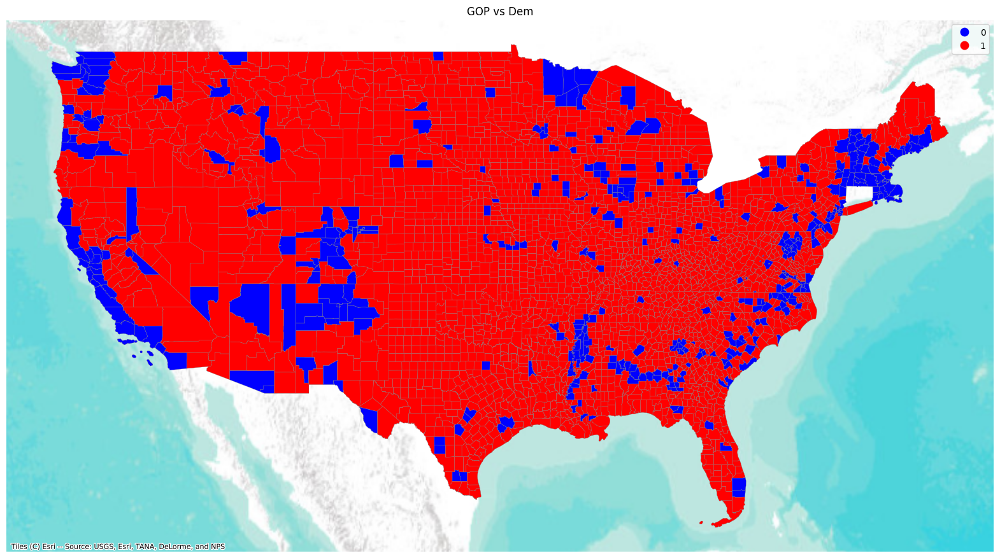

In [32]:
cmap_gop = mcolors.ListedColormap(["blue", "red"])  # Blue for 0, Red for 1
bounds = [0, 0.5, 1]
norm = mcolors.BoundaryNorm(bounds, cmap_gop.N)
f, ax = plt.subplots(1, figsize=(20, 20))
gdf.plot(
    ax=ax,
    column="win_gop",
    categorical=True,
    legend=True,
    edgecolor="0.5",
    linewidth=0.25,
    cmap=cmap_gop,  # Use custom colormap
    norm=norm,
)
ax.set_axis_off()
ax.set_title("GOP vs Dem")
#plt.axis("equal")
contextily.add_basemap(
    ax,
    crs=gdf.crs,
    source=contextily.providers.Esri.WorldTerrain,
)
plt.show()

In [23]:
gdf

,state_name,county_name,votes_gop,votes_dem,per_gop,per_dem,geometry,category,color,win_gop
county_fips,,,,,,,,,,
geoId/01001,Alabama,Autauga County,20484,7439,72.664065,26.388790,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565...",3,#6baed6,1
geoId/01003,Alabama,Baldwin County,95798,24934,78.646723,20.469920,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ...",2,#c6dbef,1
geoId/01005,Alabama,Barbour County,5606,4158,57.017901,42.290480,"POLYGON ((-85.74827 31.61803, -85.54881 31.618...",4,#2171b5,1
geoId/01007,Alabama,Bibb County,7572,1619,81.939184,17.519749,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846...",1,#f7fbff,1
geoId/01009,Alabama,Blount County,25354,2576,90.179619,9.162369,"POLYGON ((-86.96227 33.85816, -86.96294 33.844...",1,#f7fbff,1
...,...,...,...,...,...,...,...,...,...,...
geoId/56037,Wyoming,Sweetwater County,12541,3731,75.689541,22.517955,"POLYGON ((-110.05441 42.00717, -110.04642 42.0...",2,#c6dbef,1
geoId/56039,Wyoming,Teton County,4134,8748,31.612755,66.896077,"POLYGON ((-111.05346 44.66628, -111.05243 44.4...",5,#08306b,0
geoId/56041,Wyoming,Uinta County,7282,1561,81.055209,17.375334,"POLYGON ((-111.04601 40.99788, -110.51873 40.9...",1,#f7fbff,1


## Load PDFM county embeddings

In [33]:
from google.colab import files

uploaded = files.upload()

Saving county_embeddings.csv to county_embeddings.csv


In [35]:
embeddings_df = pd.read_csv("county_embeddings.csv").set_index("place")
embeddings_df.head()

,state,county,population,latitude,longitude,feature0,feature1,feature2,feature3,feature4,...,feature320,feature321,feature322,feature323,feature324,feature325,feature326,feature327,feature328,feature329
place,,,,,,,,,,,,,,,,,,,,,
geoId/01001,AL,Autauga County,58761,32.532237,-86.646439,-0.059204,1.153834,0.286746,0.324178,1.003599,...,-0.059415,-0.165617,0.816348,-0.167234,2.099072,-0.168644,1.155944,1.620912,-0.089127,4.831956
geoId/01003,AL,Baldwin County,233420,30.659218,-87.746067,-0.089298,0.710666,0.358453,1.138983,2.012795,...,-0.167371,0.049021,0.892724,-0.061048,2.791007,-0.166232,0.276117,2.892894,-0.128016,4.151655
geoId/01005,AL,Barbour County,24877,31.870253,-85.405103,-0.089458,1.756277,0.749515,0.796651,0.555815,...,-0.110057,-0.013691,0.346536,-0.106772,2.986117,-0.104402,-0.059600,1.893656,-0.147867,0.032731
geoId/01007,AL,Bibb County,22251,33.015893,-87.127148,-0.117877,0.725561,0.436291,0.307150,1.347822,...,-0.169970,-0.168179,1.796390,-0.128314,1.395750,-0.084409,3.489884,1.249768,-0.028330,4.688914
geoId/01009,AL,Blount County,59077,33.977357,-86.566440,-0.133150,0.648858,0.592053,0.382824,1.486730,...,-0.167436,0.689164,2.527887,-0.045288,0.530547,-0.156357,1.227069,1.439654,-0.045479,3.491446


In [36]:
df = embeddings_df.join(gdf)
embeddings_gdf = gpd.GeoDataFrame(df, geometry="geometry")
embeddings_gdf.head()

,state,county,population,latitude,longitude,feature0,feature1,feature2,feature3,feature4,...,state_name,county_name,votes_gop,votes_dem,per_gop,per_dem,geometry,category,color,win_gop
place,,,,,,,,,,,,,,,,,,,,,
geoId/01001,AL,Autauga County,58761,32.532237,-86.646439,-0.059204,1.153834,0.286746,0.324178,1.003599,...,Alabama,Autauga County,20484.0,7439.0,72.664065,26.388790,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565...",1.0,#053061,1.0
geoId/01003,AL,Baldwin County,233420,30.659218,-87.746067,-0.089298,0.710666,0.358453,1.138983,2.012795,...,Alabama,Baldwin County,95798.0,24934.0,78.646723,20.469920,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ...",1.0,#053061,1.0
geoId/01005,AL,Barbour County,24877,31.870253,-85.405103,-0.089458,1.756277,0.749515,0.796651,0.555815,...,Alabama,Barbour County,5606.0,4158.0,57.017901,42.290480,"POLYGON ((-85.74827 31.61803, -85.54881 31.618...",1.0,#053061,1.0
geoId/01007,AL,Bibb County,22251,33.015893,-87.127148,-0.117877,0.725561,0.436291,0.307150,1.347822,...,Alabama,Bibb County,7572.0,1619.0,81.939184,17.519749,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846...",1.0,#053061,1.0
geoId/01009,AL,Blount County,59077,33.977357,-86.566440,-0.133150,0.648858,0.592053,0.382824,1.486730,...,Alabama,Blount County,25354.0,2576.0,90.179619,9.162369,"POLYGON ((-86.96227 33.85816, -86.96294 33.844...",1.0,#053061,1.0


## Visualize PDFM features

In [37]:
column = "feature329"  # Change this to the feature you want to use
gdf = embeddings_gdf[[column, "state", "county", "geometry"]]
gdf.head()

,feature329,state,county,geometry
place,,,,
geoId/01001,4.831956,AL,Autauga County,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565..."
geoId/01003,4.151655,AL,Baldwin County,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ..."
geoId/01005,0.032731,AL,Barbour County,"POLYGON ((-85.74827 31.61803, -85.54881 31.618..."
geoId/01007,4.688914,AL,Bibb County,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846..."
geoId/01009,3.491446,AL,Blount County,"POLYGON ((-86.96227 33.85816, -86.96294 33.844..."


In [40]:
m = leafmap.Map(style="liberty")
m.add_data(
    gdf,
    cmap="Reds",
    column=column,
    legend_title=column,
    before_id=first_symbol_id,
    name=column,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 0, 'style': 'https://tiles.openfree…

In [41]:
m = leafmap.Map(style="liberty", pitch=60)
m.add_data(
    gdf,
    cmap="Reds",
    column=column,
    legend_title=column,
    before_id=first_symbol_id,
    name=column,
    extrude=True,
    scale_factor=0.00005,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 60, 'style': 'https://tiles.openfre…

In [54]:
embeddings_gdf

,state,county,population,latitude,longitude,feature0,feature1,feature2,feature3,feature4,...,state_name,county_name,votes_gop,votes_dem,per_gop,per_dem,geometry,category,color,win_gop
place,,,,,,,,,,,,,,,,,,,,,
geoId/01001,AL,Autauga County,58761,32.532237,-86.646439,-0.059204,1.153834,0.286746,0.324178,1.003599,...,Alabama,Autauga County,20484.0,7439.0,72.664065,26.388790,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565...",1.0,#053061,1.0
geoId/01003,AL,Baldwin County,233420,30.659218,-87.746067,-0.089298,0.710666,0.358453,1.138983,2.012795,...,Alabama,Baldwin County,95798.0,24934.0,78.646723,20.469920,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ...",1.0,#053061,1.0
geoId/01005,AL,Barbour County,24877,31.870253,-85.405103,-0.089458,1.756277,0.749515,0.796651,0.555815,...,Alabama,Barbour County,5606.0,4158.0,57.017901,42.290480,"POLYGON ((-85.74827 31.61803, -85.54881 31.618...",1.0,#053061,1.0
geoId/01007,AL,Bibb County,22251,33.015893,-87.127148,-0.117877,0.725561,0.436291,0.307150,1.347822,...,Alabama,Bibb County,7572.0,1619.0,81.939184,17.519749,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846...",1.0,#053061,1.0
geoId/01009,AL,Blount County,59077,33.977357,-86.566440,-0.133150,0.648858,0.592053,0.382824,1.486730,...,Alabama,Blount County,25354.0,2576.0,90.179619,9.162369,"POLYGON ((-86.96227 33.85816, -86.96294 33.844...",1.0,#053061,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
geoId/56037,WY,Sweetwater County,42079,41.660328,-108.875677,-0.063610,0.934990,0.400831,0.443420,1.147422,...,Wyoming,Sweetwater County,12541.0,3731.0,75.689541,22.517955,"POLYGON ((-110.05441 42.00717, -110.04642 42.0...",1.0,#053061,1.0
geoId/56039,WY,Teton County,23346,44.048662,-110.426075,-0.094174,1.141469,1.828613,1.950659,1.302107,...,Wyoming,Teton County,4134.0,8748.0,31.612755,66.896077,"POLYGON ((-111.05346 44.66628, -111.05243 44.4...",1.0,#053061,0.0
geoId/56041,WY,Uinta County,20546,41.284726,-110.558947,-0.084327,1.105458,2.132980,0.434162,1.792016,...,Wyoming,Uinta County,7282.0,1561.0,81.055209,17.375334,"POLYGON ((-111.04601 40.99788, -110.51873 40.9...",1.0,#053061,1.0


In [50]:
embedding_features = [f"feature{x}" for x in range(330)]
label = "votes_gop"  # Change this to the date you want to predict

In [52]:
data = embeddings_gdf.dropna(subset=[label])

In [53]:
data

,state,county,population,latitude,longitude,feature0,feature1,feature2,feature3,feature4,...,state_name,county_name,votes_gop,votes_dem,per_gop,per_dem,geometry,category,color,win_gop
place,,,,,,,,,,,,,,,,,,,,,
geoId/01001,AL,Autauga County,58761,32.532237,-86.646439,-0.059204,1.153834,0.286746,0.324178,1.003599,...,Alabama,Autauga County,20484.0,7439.0,72.664065,26.388790,"POLYGON ((-86.91743 32.66417, -86.9212 32.6565...",1.0,#053061,1.0
geoId/01003,AL,Baldwin County,233420,30.659218,-87.746067,-0.089298,0.710666,0.358453,1.138983,2.012795,...,Alabama,Baldwin County,95798.0,24934.0,78.646723,20.469920,"MULTIPOLYGON (((-87.44728 30.51503, -87.44562 ...",1.0,#053061,1.0
geoId/01005,AL,Barbour County,24877,31.870253,-85.405103,-0.089458,1.756277,0.749515,0.796651,0.555815,...,Alabama,Barbour County,5606.0,4158.0,57.017901,42.290480,"POLYGON ((-85.74827 31.61803, -85.54881 31.618...",1.0,#053061,1.0
geoId/01007,AL,Bibb County,22251,33.015893,-87.127148,-0.117877,0.725561,0.436291,0.307150,1.347822,...,Alabama,Bibb County,7572.0,1619.0,81.939184,17.519749,"POLYGON ((-87.42192 33.0034, -87.42075 32.8846...",1.0,#053061,1.0
geoId/01009,AL,Blount County,59077,33.977357,-86.566440,-0.133150,0.648858,0.592053,0.382824,1.486730,...,Alabama,Blount County,25354.0,2576.0,90.179619,9.162369,"POLYGON ((-86.96227 33.85816, -86.96294 33.844...",1.0,#053061,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
geoId/56037,WY,Sweetwater County,42079,41.660328,-108.875677,-0.063610,0.934990,0.400831,0.443420,1.147422,...,Wyoming,Sweetwater County,12541.0,3731.0,75.689541,22.517955,"POLYGON ((-110.05441 42.00717, -110.04642 42.0...",1.0,#053061,1.0
geoId/56039,WY,Teton County,23346,44.048662,-110.426075,-0.094174,1.141469,1.828613,1.950659,1.302107,...,Wyoming,Teton County,4134.0,8748.0,31.612755,66.896077,"POLYGON ((-111.05346 44.66628, -111.05243 44.4...",1.0,#053061,0.0
geoId/56041,WY,Uinta County,20546,41.284726,-110.558947,-0.084327,1.105458,2.132980,0.434162,1.792016,...,Wyoming,Uinta County,7282.0,1561.0,81.055209,17.375334,"POLYGON ((-111.04601 40.99788, -110.51873 40.9...",1.0,#053061,1.0


## Split Train and Test Data

In [55]:
data = data[embedding_features + [label]]
X = data[embedding_features]
y = data[label]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [56]:
data

,feature0,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature321,feature322,feature323,feature324,feature325,feature326,feature327,feature328,feature329,votes_gop
place,,,,,,,,,,,,,,,,,,,,,
geoId/01001,-0.059204,1.153834,0.286746,0.324178,1.003599,0.513522,0.902274,0.864100,1.302881,0.652177,...,-0.165617,0.816348,-0.167234,2.099072,-0.168644,1.155944,1.620912,-0.089127,4.831956,20484.0
geoId/01003,-0.089298,0.710666,0.358453,1.138983,2.012795,1.213017,1.275223,1.014438,1.012046,1.867494,...,0.049021,0.892724,-0.061048,2.791007,-0.166232,0.276117,2.892894,-0.128016,4.151655,95798.0
geoId/01005,-0.089458,1.756277,0.749515,0.796651,0.555815,0.922948,1.383325,1.098367,0.339502,1.022523,...,-0.013691,0.346536,-0.106772,2.986117,-0.104402,-0.059600,1.893656,-0.147867,0.032731,5606.0
geoId/01007,-0.117877,0.725561,0.436291,0.307150,1.347822,0.816905,0.959373,1.338937,0.236924,1.146285,...,-0.168179,1.796390,-0.128314,1.395750,-0.084409,3.489884,1.249768,-0.028330,4.688914,7572.0
geoId/01009,-0.133150,0.648858,0.592053,0.382824,1.486730,0.684712,1.131317,1.124898,0.432623,2.480159,...,0.689164,2.527887,-0.045288,0.530547,-0.156357,1.227069,1.439654,-0.045479,3.491446,25354.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
geoId/56037,-0.063610,0.934990,0.400831,0.443420,1.147422,-0.011227,0.800387,0.212383,0.324835,0.464475,...,-0.066294,4.258873,-0.163297,3.155700,-0.156553,-0.169519,-0.156945,-0.002064,4.597163,12541.0
geoId/56039,-0.094174,1.141469,1.828613,1.950659,1.302107,1.467974,1.435613,1.039088,0.381357,0.914541,...,-0.166676,1.484411,0.351160,1.463941,0.064016,0.113911,0.532805,-0.005167,3.825687,4134.0
geoId/56041,-0.084327,1.105458,2.132980,0.434162,1.792016,0.432017,0.353586,0.913778,0.360714,0.929064,...,-0.123030,3.596032,-0.082731,3.312787,0.068308,0.864396,-0.149780,-0.010434,2.912843,7282.0


## Fit Linear Regression Model

In [57]:
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

## Evaluate Linear Regression Model

In [58]:
evaluation_df = pd.DataFrame({"y": y_test, "y_pred": y_pred})
metrics = evaluate_model(evaluation_df)
print(metrics)

{'r2': 0.6504335211173735, 'r': 0.821643021344523, 'rmse': 45170.32613018701, 'mae': 17118.862702554416, 'mape': 2.3943364527994326}


In [60]:
xy_lim = (0, 1_000_000)
plot_actual_vs_predicted(
    evaluation_df,
    xlim=xy_lim,
    ylim=xy_lim,
    title="Actual vs Predicted vote number",
    x_label="Actual vote number",
    y_label="Predicted vote number",
)

## Join predicted values with county boundaries

In [79]:
df = evaluation_df.join(gdf)
df["difference"] = df["y_pred"] - df["y"]
evaluation_gdf = gpd.GeoDataFrame(df, geometry="geometry")
evaluation_gdf.drop(columns=["category", "color", column], inplace=True)
evaluation_gdf=evaluation_gdf[evaluation_gdf["y_pred"]>0]
evaluation_gdf.head()

,y,y_pred,state,county,geometry,difference
place,,,,,,
geoId/01127,25464.0,8575.754938,AL,Walker County,"POLYGON ((-87.6361 34.00219, -87.63606 33.8719...",-16888.245062
geoId/37149,8107.0,14919.664185,NC,Polk County,"POLYGON ((-82.35832 35.22831, -82.35092 35.228...",6812.664185
geoId/39037,22234.0,561.767007,OH,Darke County,"POLYGON ((-84.80823 40.1157, -84.8116 39.91691...",-21672.232993
geoId/12097,86713.0,191432.589228,FL,Osceola County,"POLYGON ((-81.65644 28.34712, -81.6572 28.2592...",104719.589228
geoId/19127,9815.0,12094.508144,IA,Marshall County,"POLYGON ((-93.23166 42.20802, -93.23184 41.862...",2279.508144


## Visualize actual GOP vote number

In [69]:
m = leafmap.Map(style="liberty", pitch=60)
m.add_data(
    evaluation_gdf,
    cmap="Reds",
    column="y",
    legend_title="Actual GOP vote number",
    before_id=first_symbol_id,
    name="Actual GOP vote number",
    extrude=True,
    scale_factor=3,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 60, 'style': 'https://tiles.openfre…

## Visualize Predicted GOP Vote Number

In [80]:
m = leafmap.Map(style="liberty", pitch=60)
m.add_data(
    evaluation_gdf,
    cmap="Blues",
    column="y_pred",
    legend_title="Predicted GOP Vote Number",
    before_id=first_symbol_id,
    name="Predicted GOP Vote Number",
    extrude=True,
    scale_factor=3,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 60, 'style': 'https://tiles.openfre…

## Visualize difference between predicted and actual vote number for GOP

In [81]:
m = leafmap.Map(style="liberty", pitch=60)
m.add_data(
    evaluation_gdf,
    cmap="coolwarm",
    column="difference",
    legend_title="y_pred-y",
    before_id=first_symbol_id,
    name="Difference",
    extrude=True,
    scale_factor=3,
)
m.add_layer_control()
m

Map(height='600px', map_options={'bearing': 0, 'center': (0, 20), 'pitch': 60, 'style': 'https://tiles.openfre…